# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

!pip install RegscorePy
from RegscorePy import *

In [2]:
pd.options.display.max_rows = 200000

In [3]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

# Data Loading

## Handling 'NA' values

In [37]:
df = pd.read_csv('train.csv')

In [38]:
df.isnull().sum().sum()

7829

There are many columns in the data set which has value 'NA'. If we read the data set using read_csv, by default 'NA' value is being treated as Null which is not ideal for some columns as 'NA' holds some valuable information.

In [39]:
df = pd.read_csv('train.csv', keep_default_na=False)

In [40]:
df.isnull().sum().sum()

0

The above is not again ideal as it ignores all the null values and it will be hard to identify which columns have Null values.

In [41]:
# Removed 'NA' from the list of default values pandas treats as Nulls

df = pd.read_csv('train.csv', keep_default_na=False, na_values=['','#N/A','#N/A N/A','#NA','-1.#IND','-1.#QNAN','-NaN','-nan','1.#IND','1.#QNAN','N/A','NULL','NaN','n/a','nan','null'])

In [42]:
df.isnull().sum().sum()

0

This tells us that there are no Nulls in the data set except for 'NA's which are treated as NULLs in some comlumns.

In [43]:
cat_cols = [cname for cname in df.columns if df[cname].dtype == "object"]
na_cols = []

na_count = 0

for col in cat_cols:
    na_count = na_count + (df[col]=='NA').sum()

for col in cat_cols:
    if (df[col]=='NA').sum() > 0:
        na_cols.append(col)

print(na_count)
print(na_cols)

6965
['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


6965 is the total number of 'NA' values present in the string columns as read by pandas.

Below code takes out the numeric columns that are treated as string columns due to the presence of 'NA'.

In [44]:
na_numeric_cols = []
na_numeric_count = 0
na_string_count = 0

for col in na_cols:
    for value in df[col]:
        if value.isdigit() == True:
            na_numeric_cols.append(col)
            na_numeric_count = na_numeric_count + (df[col]=='NA').sum()
            break

print(na_numeric_cols)
print(na_numeric_count)

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
348


Below code gives the actual categorical/string columns that have 'NA' values.

In [45]:
na_cat_cols = na_cols.copy()

for col in na_numeric_cols:
    na_cat_cols.remove(col)

na_cat_cols

['Alley',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [46]:
na_cat_count = 0

for col in na_cat_cols:
    na_cat_count = na_cat_count + (df[col]=='NA').sum()

na_cat_count

6617

6617 + 348 = 6965 => Which is the total number of NAs identified in the cat cols.

This was we identified that ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'] columns are supposed to be numeric cols but are getting converted into string columns due to 'NA'.

We will handle this as shown below.

We are explicitly calling out to consider 'NA' values in these columns as Nulls.

In [47]:
df = pd.read_csv('train.csv', keep_default_na=False, na_values={'LotFrontage' : 'NA', 'MasVnrArea' : 'NA', 'GarageYrBlt' : 'NA'})

In [48]:
df.isnull().sum().sum()

348

348 Nulls are coming from converting 'NA's in the columns ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'] to Nulls.

In [49]:
na_count = 0

for col in na_cat_cols:
    na_count = na_count + (df[col]=='NA').sum()

na_count

6617

6617 is the number of 'NA's in the other categorical columns which has 'NA's. Thus, the math adds up.

In [50]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,12,2008,WD,Normal,250000


In [51]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

# Variable Identification

Clearly, "SalePrice" is our target/response variable and the others are predictor variables.

# Data Understanding

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [53]:
# Unique data types

df.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [54]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [55]:
# Categorical columns in the data set

cat_cols = [cname for cname in df.columns if df[cname].dtype == "object"]

cat_cols

['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

In [56]:
# Numeric columns in the data set

numeric_cols = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64']]

numeric_cols

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

## Unique Value Counts

In [57]:
# Unique value counts/frequencies of each column to determine if there are any columns with only a single value/all different values

unique_values = pd.DataFrame(df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)

unique_values['dtype'] = pd.DataFrame(df.dtypes)

unique_values

,Unique Value Count,dtype
CentralAir,2,object
Street,2,object
Utilities,2,object
PavedDrive,3,object
Alley,3,object
BsmtHalfBath,3,int64
HalfBath,3,int64
LandSlope,3,object
KitchenAbvGr,4,int64
PoolQC,4,object


Id column can be dropped as it has all different values and doesn't add any value to the analysis.

In [58]:
# Deleting Id column as it has only single value

df.drop('Id', axis=1, inplace=True)
numeric_cols.remove('Id')

In [59]:
# Unique value distribution of the numeric variables

for col in numeric_cols:
    print('\n############################################')
    print('Unique value distribution of ' + str(col))
    print('############################################')
    print(df[col].value_counts(dropna=False).sort_values(ascending = False))


############################################
Unique value distribution of MSSubClass
############################################
MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64

############################################
Unique value distribution of LotFrontage
############################################
LotFrontage
NaN      259
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
90.0      23
21.0      23
64.0      19
24.0      19
68.0      19
73.0      18
72.0      17
63.0      17
79.0      17
55.0      17
100.0     16
66.0      15
51.0      15
74.0      15
52.0      14
59.0      13
67.0      12
40.0      12
43.0      12
57.0      12
82.0      12
71.0      12
76.0      11
69.0      11
88.0      10
34.0      10
53.0      10
86.0      10
92.0      10
44.0       9
77.0       9
62.

In [60]:
# Unique value distribution of the categorical variables

for col in cat_cols:
    print('\n############################################')
    print('Unique value distribution of ' + str(col))
    print('############################################')
    print(df[col].value_counts(dropna=False).sort_values(ascending = False))


############################################
Unique value distribution of MSZoning
############################################
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64

############################################
Unique value distribution of Street
############################################
Street
Pave    1454
Grvl       6
Name: count, dtype: int64

############################################
Unique value distribution of Alley
############################################
Alley
NA      1369
Grvl      50
Pave      41
Name: count, dtype: int64

############################################
Unique value distribution of LotShape
############################################
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64

############################################
Unique value distribution of LandContour
############################################
LandContour
Lvl    1311
Bnk      

## Min Max Values of all columns

In [61]:
# Check if all the values of the variables are in the same scale

numeric_cols = [cname for cname in df.columns if
                                df[cname].dtype in ['int64', 'float64']]

Max = pd.DataFrame(df[numeric_cols].max().rename('Max'))
Min = pd.DataFrame(df[numeric_cols].min().rename('Min'))

pd.concat([Max, Min], axis=1)

,Max,Min
MSSubClass,190.0,20.0
LotFrontage,313.0,21.0
LotArea,215245.0,1300.0
OverallQual,10.0,1.0
OverallCond,9.0,1.0
YearBuilt,2010.0,1872.0
YearRemodAdd,2010.0,1950.0
MasVnrArea,1600.0,0.0
BsmtFinSF1,5644.0,0.0
BsmtFinSF2,1474.0,0.0


Values of some variables like MasVnrArea has a huge difference in the min and max values.

# Data Cleaning

## Standardizing Values

In [62]:
# Convert all text column values to lower case

for col in cat_cols:
    df[col] = df[col].str.lower()

In [63]:
# There is a chance of having duplicate values due to spelling mistakes of the same variable value

for col in cat_cols:
    print('\n################################')
    print('Unique values of ' + str(col))
    print('################################')
    print(pd.Series(df[col].unique()).sort_values(ascending=False))


################################
Unique values of MSZoning
################################
1         rm
0         rl
4         rh
3         fv
2    c (all)
dtype: object

################################
Unique values of Street
################################
0    pave
1    grvl
dtype: object

################################
Unique values of Alley
################################
2    pave
0      na
1    grvl
dtype: object

################################
Unique values of LotShape
################################
0    reg
3    ir3
2    ir2
1    ir1
dtype: object

################################
Unique values of LandContour
################################
0    lvl
2    low
3    hls
1    bnk
dtype: object

################################
Unique values of Utilities
################################
1    nosewa
0    allpub
dtype: object

################################
Unique values of LotConfig
################################
0     inside
4        fr3
1        fr2
3    culdsac
2 

No spelling mistakes found in any of the variable values.

## Duplicates

In [64]:
df.duplicated().value_counts()

False    1460
Name: count, dtype: int64

There are no duplicate rows in the data set.

## Missing Values

In [65]:
# % of nulls in each column

null_series = pd.Series(round(100*(df.isnull().sum(axis=0)/len(df.index)), 2).sort_values(ascending = False))
null_series.loc[null_series.values > 0]

LotFrontage    17.74
GarageYrBlt     5.55
MasVnrArea      0.55
dtype: float64

In [66]:
# Imputation

df['LotFrontage'].fillna(value=df['LotFrontage'].quantile(0.75) - df['LotFrontage'].quantile(0.25), inplace=True)
df['GarageYrBlt'].fillna(value=df['GarageYrBlt'].mode().values[0], inplace=True)
df['MasVnrArea'].fillna(value=df['MasVnrArea'].quantile(0.75) - df['MasVnrArea'].quantile(0.25), inplace=True)

Imputed nulls of LotFrontage & MasVnrArea with IQR.

Imputed nulls of GarageYrBlt with mode.

In [67]:
# % of nulls in each column

null_series = pd.Series(round(100*(df.isnull().sum(axis=0)/len(df.index)), 2).sort_values(ascending = False))
null_series.loc[null_series.values > 0]

Series([], dtype: float64)

Now, there are no nulls in the data set.

# EDA

## Univariate Analysis

In [68]:
def univariate_continuos(df):

    numeric_cols = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64']]

    for col in numeric_cols:

        sns.boxplot(df[col])
        plt.title(col)
        plt.show()

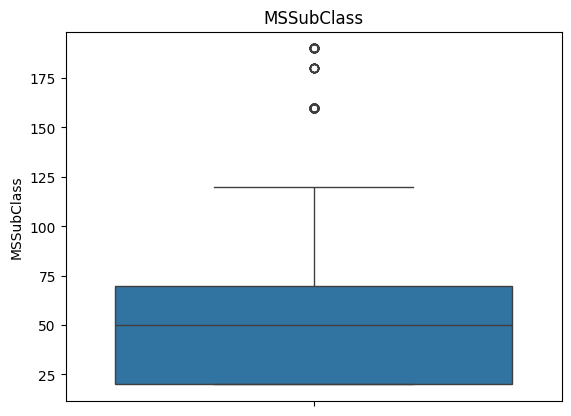

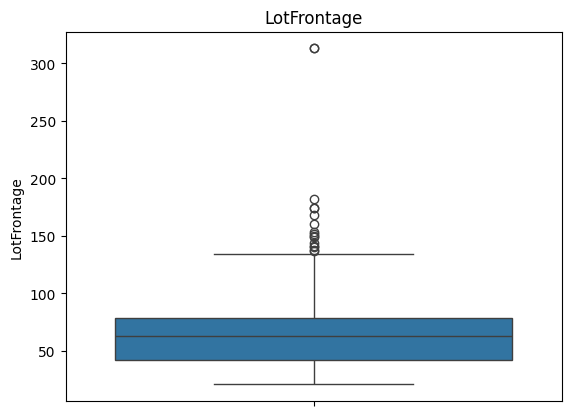

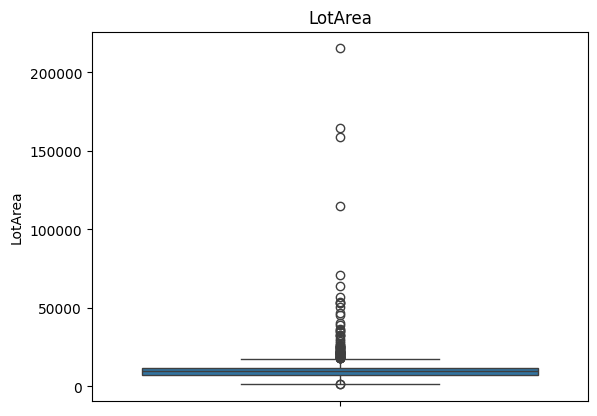

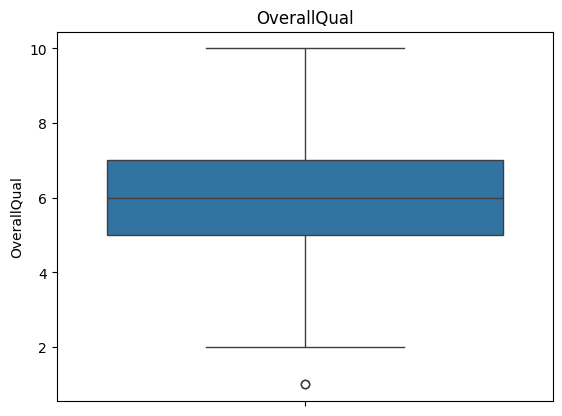

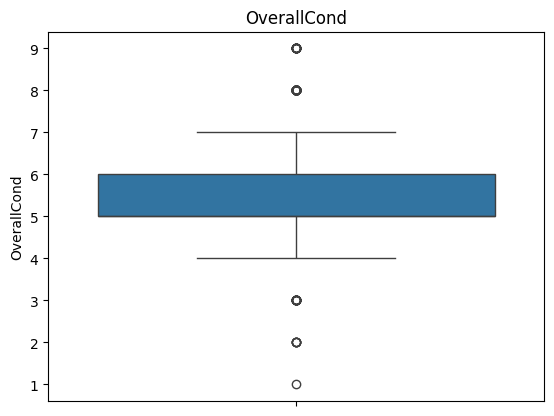

...

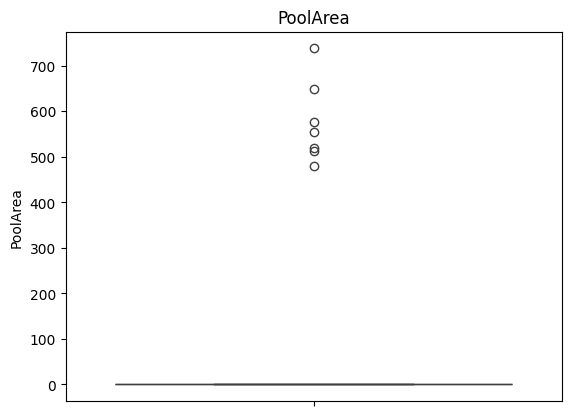

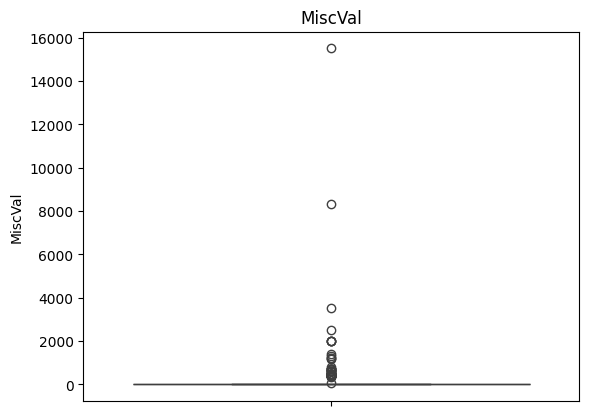

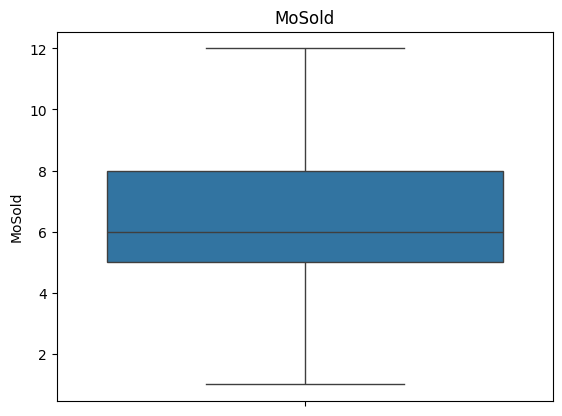

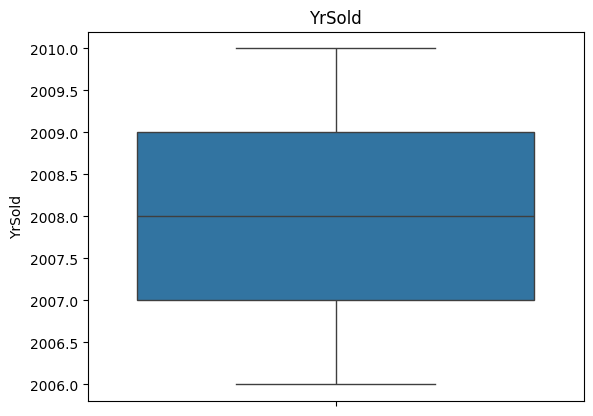

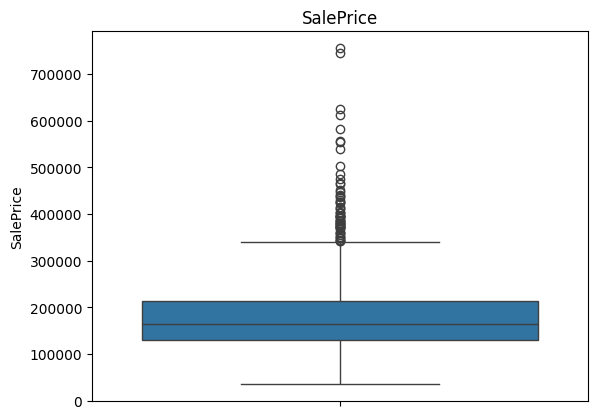

In [69]:
univariate_continuos(df)

We see outliers in a lot of variables. This will be handled in the outlier treatment section.

In [70]:
def bivariate_continuos(df, target):

    numeric_cols = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64', 'uint8']]

    for col in numeric_cols:
        sns.regplot(x=col, y=target, data=df)
        plt.show()

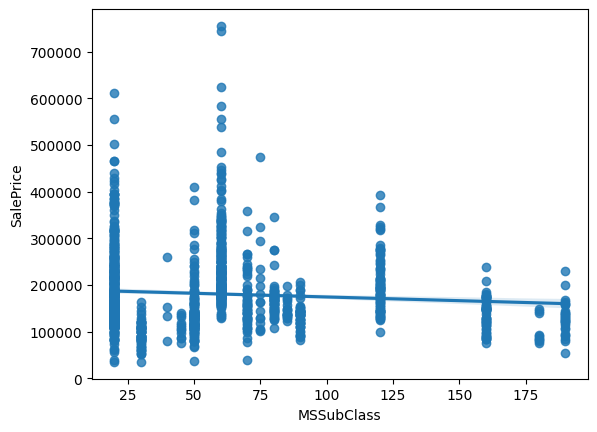

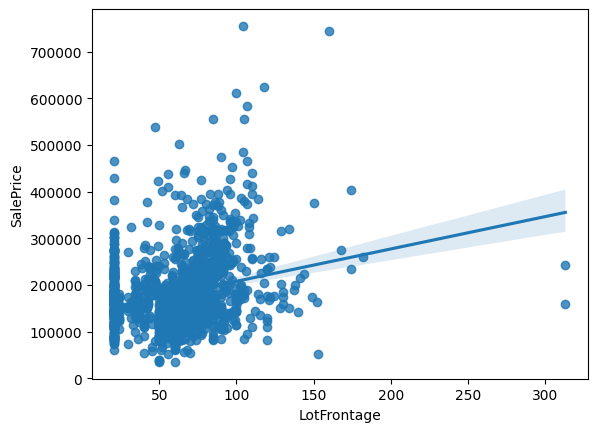

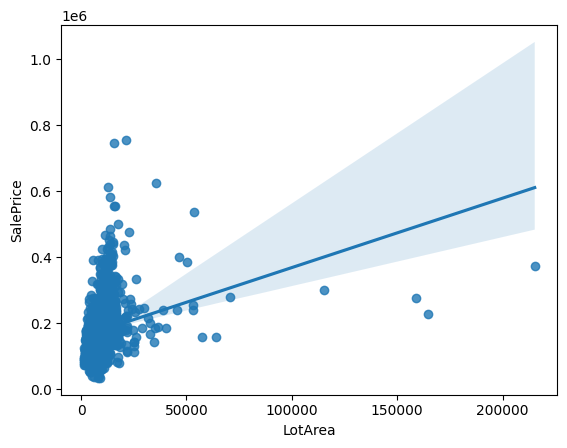

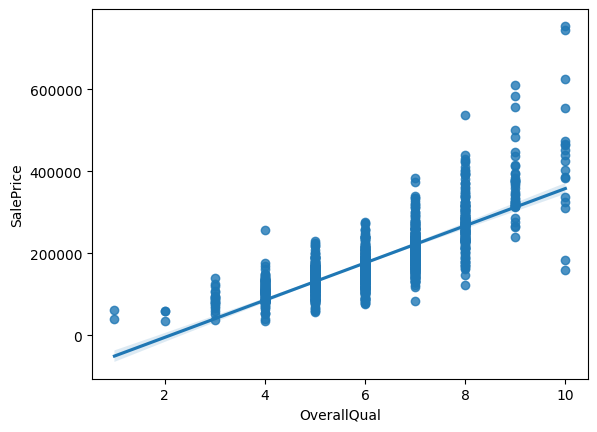

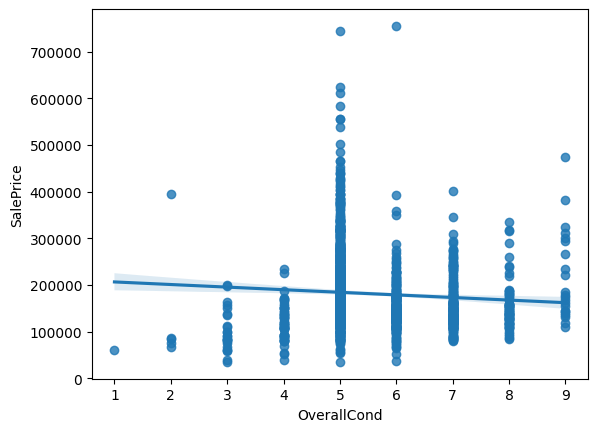

...

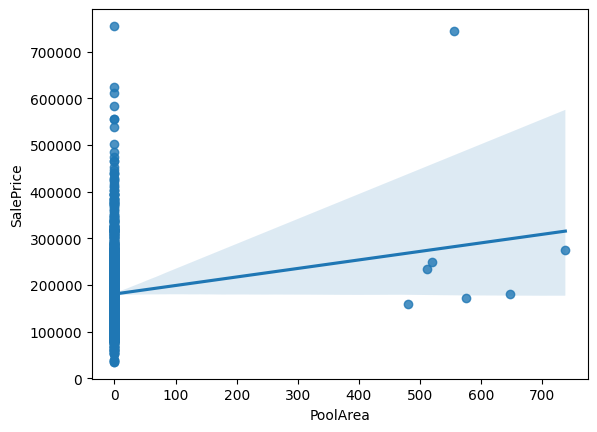

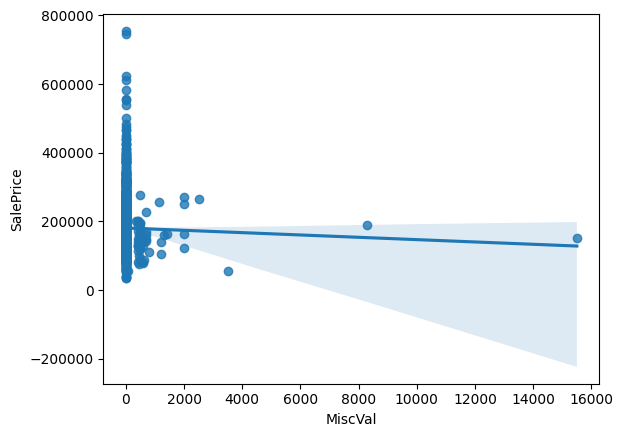

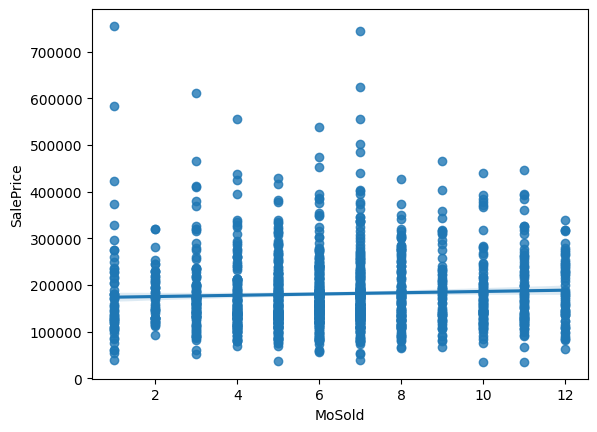

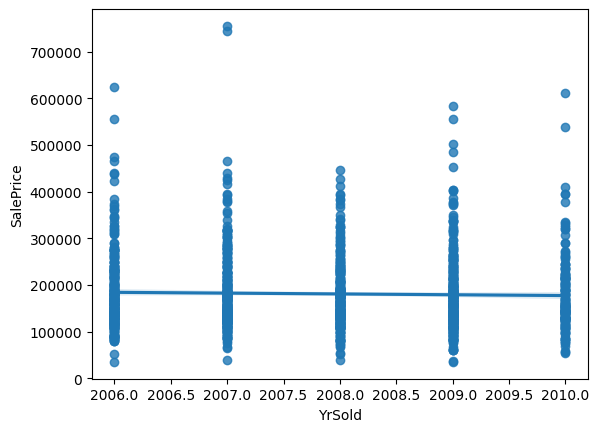

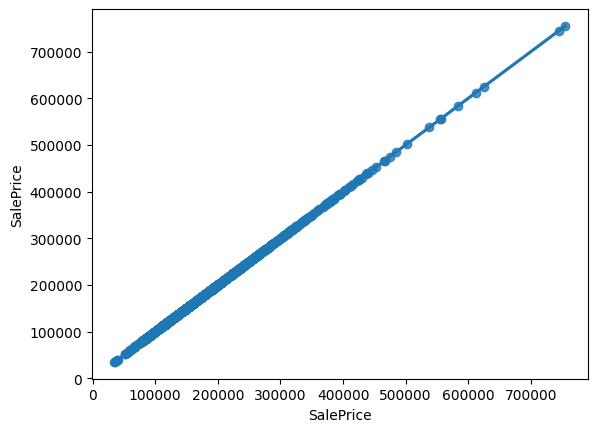

In [71]:
bivariate_continuos(df, 'SalePrice')

Scatter plots with the target variable "SalePrice" doesn't show a need for any feature transformation.

## Multivariate Analysis

In [72]:
# paiwise scatter plot

plt.figure(figsize=(20, 10))
sns.pairplot(df[numeric_cols])
plt.show()

<Figure size 2000x1000 with 0 Axes>

This is quite hard to read, and we can rather plot correlations between variables. Also, a heatmap is pretty useful to visualise multiple correlations in one plot.

In [73]:
df[numeric_cols].corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.261981,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022467,-0.069836,-0.065649,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.261981,1.000000,0.154590,0.201652,-0.056925,0.057778,0.084931,0.128900,0.113622,0.002079,...,0.003520,0.089799,0.025203,0.033953,0.027881,0.137060,-0.049760,0.018217,-0.008605,0.252392
LotArea,-0.139781,0.154590,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104255,0.214103,0.111170,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.201652,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411678,0.239666,-0.059119,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.056925,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128937,-0.046231,0.040229,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.057778,0.014228,0.572323,-0.375983,1.000000,0.592855,0.316364,0.249503,-0.049107,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.084931,0.013788,0.550684,0.073741,0.592855,1.000000,0.180630,0.128451,-0.067759,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.022467,0.128900,0.104255,0.411678,-0.128937,0.316364,0.180630,1.000000,0.264753,-0.072825,...,0.158826,0.126323,-0.109719,0.018569,0.060922,0.011589,-0.029971,-0.005463,-0.008097,0.476410
BsmtFinSF1,-0.069836,0.113622,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264753,1.000000,-0.050117,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,-0.065649,0.002079,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.072825,-0.050117,1.000000,...,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378


SalePrice is highly correlated with OverallQual. Let's see if this shows up in the results of the Ridge/Lasso regression.

# Outlier Treatment

In [74]:
def outlier_treatment(df, col):

    print('#########################')
    print(col)
    print('#########################')

    Q1 = df[col].quantile(0.25)
    print('Q1 is => ' + str(Q1))

    Q3 = df[col].quantile(0.75)
    print('Q3 is => ' + str(Q3))

    IQR = Q3 - Q1

    fence_low  = Q1-1.5*IQR
    print('Fence Low is => ' + str(fence_low))

    fence_high = Q3+1.5*IQR
    print('Fence High is => ' + str(fence_high))

    df.loc[(df[col] > fence_high), col] = fence_high
    df.loc[(df[col] < fence_low), col] = fence_low

    print('\n')

    return df

def outlier_treatment_max(df, col):

    print('#########################')
    print(col)
    print('#########################')

    Q1 = df[col].quantile(0.25)
    print('Q1 is => ' + str(Q1))

    Q3 = df[col].quantile(0.75)
    print('Q3 is => ' + str(Q3))

    IQR = Q3 - Q1

    fence_high = Q3+1.5*IQR
    print('Fence High is => ' + str(fence_high))

    df.loc[(df[col] > fence_high), col] = fence_high

    print('\n')

    return df

def outlier_treatment_min(df, col):

    print('#########################')
    print(col)
    print('#########################')

    Q1 = df[col].quantile(0.25)
    print('Q1 is => ' + str(Q1))

    Q3 = df[col].quantile(0.75)
    print('Q3 is => ' + str(Q3))

    IQR = Q3 - Q1

    fence_low  = Q1-1.5*IQR
    print('Fence Low is => ' + str(fence_low))

    df.loc[(df[col] < fence_low), col] = fence_low

    print('\n')

    return df

In [75]:
df = outlier_treatment_max(df, 'MSSubClass')
df = outlier_treatment_max(df, 'LotFrontage')
df = outlier_treatment_max(df, 'LotArea')
df = outlier_treatment(df, 'OverallCond')
df = outlier_treatment_max(df, 'MasVnrArea')
df = outlier_treatment_max(df, 'BsmtFinSF1')
df = outlier_treatment_max(df, 'BsmtFinSF2')
df = outlier_treatment_max(df, 'BsmtUnfSF')
df = outlier_treatment_max(df, 'TotalBsmtSF')
df = outlier_treatment_max(df, '1stFlrSF')
df = outlier_treatment_max(df, '2ndFlrSF')
df = outlier_treatment_max(df, 'LowQualFinSF')
df = outlier_treatment_max(df, 'GrLivArea')
df = outlier_treatment_max(df, 'BsmtHalfBath')
df = outlier_treatment(df, 'BedroomAbvGr')
df = outlier_treatment(df, 'KitchenAbvGr')
df = outlier_treatment_max(df, 'TotRmsAbvGrd')
df = outlier_treatment_max(df, 'GarageArea')
df = outlier_treatment_max(df, 'WoodDeckSF')
df = outlier_treatment_max(df, 'OpenPorchSF')
df = outlier_treatment_max(df, 'EnclosedPorch')
df = outlier_treatment_max(df, '3SsnPorch')
df = outlier_treatment_max(df, 'ScreenPorch')
df = outlier_treatment_max(df, 'PoolArea')
df = outlier_treatment_max(df, 'MiscVal')

#########################
MSSubClass
#########################
Q1 is => 20.0
Q3 is => 70.0
Fence High is => 145.0


#########################
LotFrontage
#########################
Q1 is => 42.0
Q3 is => 79.0
Fence High is => 134.5


#########################
LotArea
#########################
Q1 is => 7553.5
Q3 is => 11601.5
Fence High is => 17673.5


#########################
OverallCond
#########################
Q1 is => 5.0
Q3 is => 6.0
Fence Low is => 3.5
Fence High is => 7.5


#########################
MasVnrArea
#########################
Q1 is => 0.0
Q3 is => 166.0
Fence High is => 415.0


#########################
BsmtFinSF1
#########################
Q1 is => 0.0
Q3 is => 712.25
Fence High is => 1780.625


#########################
BsmtFinSF2
#########################
Q1 is => 0.0
Q3 is => 0.0
Fence High is => 0.0


#########################
BsmtUnfSF
#########################
Q1 is => 223.0
Q3 is => 808.0
Fence High is => 1685.5


#########################
TotalBsmtSF
##########

If the outliers are on the higher end of the variable value, imputed the values which are greater than Q3+1.5*IQR with Q3+1.5*IQR.

If the outliers on the lower end of the variable value, imputed the values which are lesser than Q1-1.5*IQR with Q1-1.5*IQR.

If the outliers are on both the ends of the variable values, imputed the values which are greater than Q3+1.5*IQR with Q3+1.5*IQR and which are lesser than Q1-1.5*IQR with Q1-1.5*IQR.

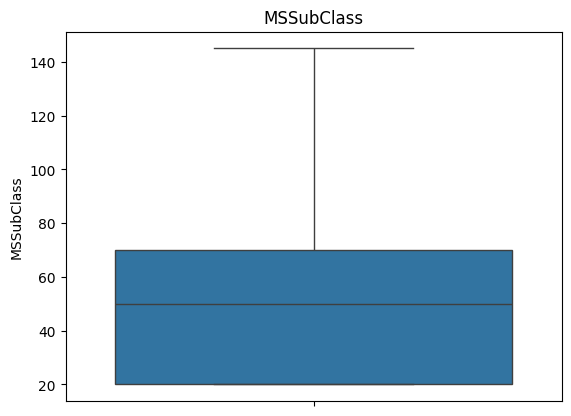

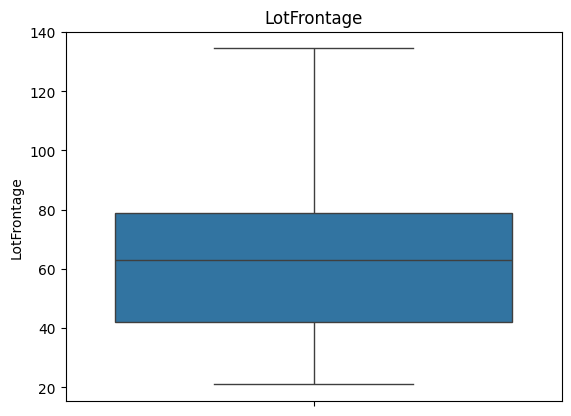

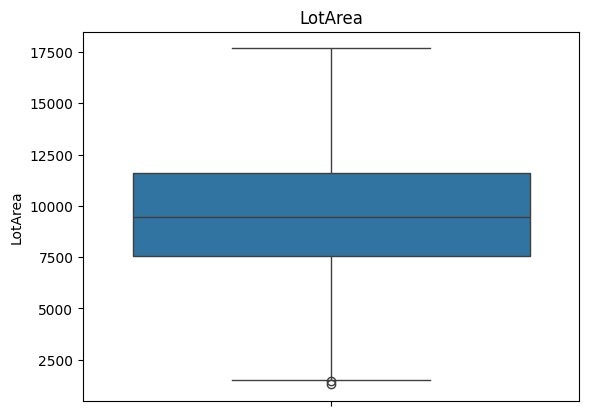

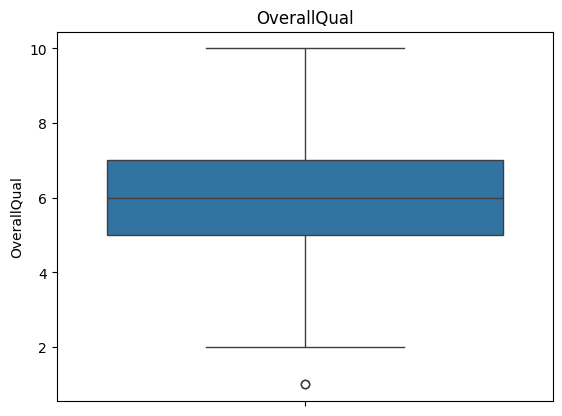

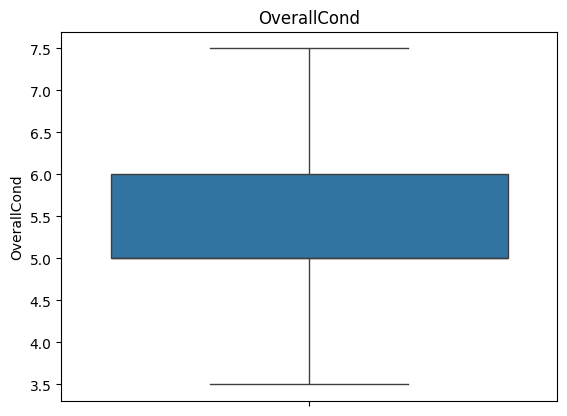

...

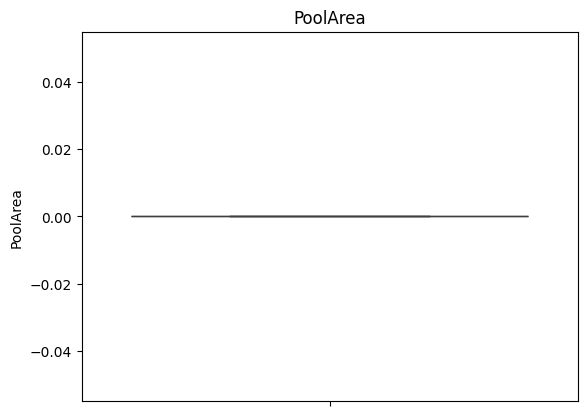

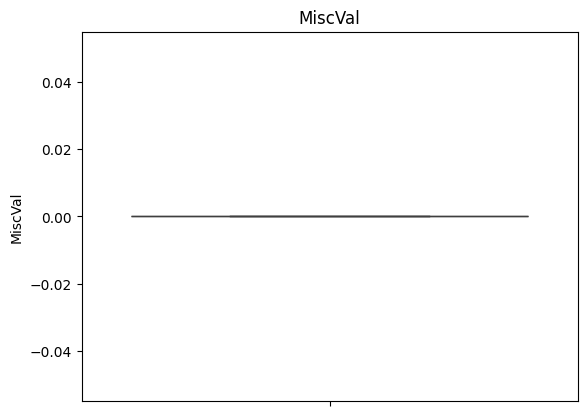

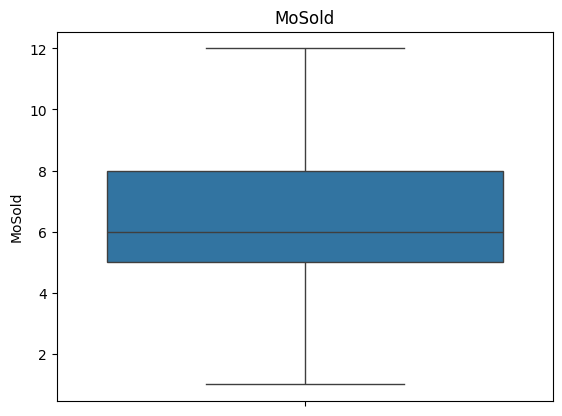

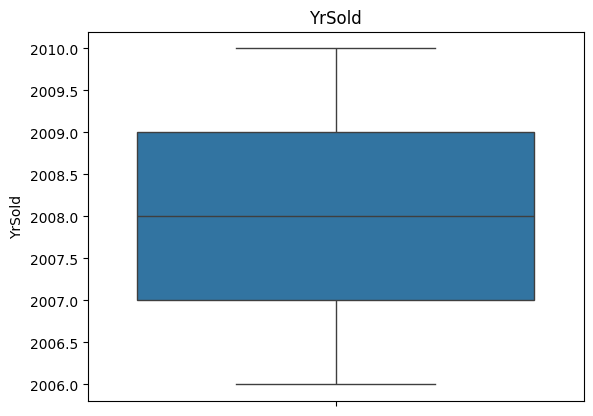

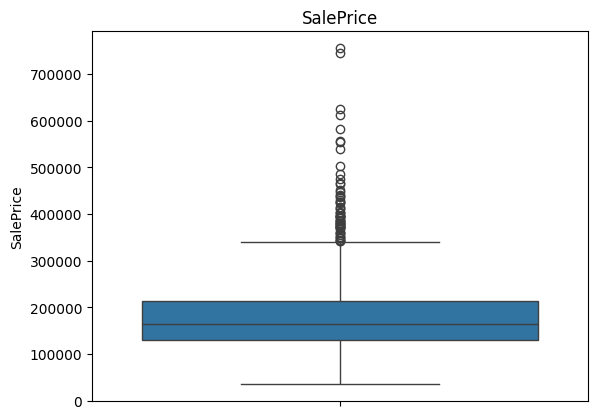

In [76]:
univariate_continuos(df)

# Data Preparation

## Feature Encoding

These are the variable which has 'NA' values.

The approach we take here is : Create dummies for all the categorical variables and for those which have 'NA' values, we drop the 'NA' dummy variable.

In [77]:
na_cat_cols

['Alley',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [78]:
cat_cols = [cname for cname in df.columns if df[cname].dtype in ['object']]

for col in cat_cols:
    if col in na_cat_cols:
        na_dummy = pd.get_dummies(df[col], prefix=col)
        del na_dummy[col+'_'+'na']
        df = pd.concat([df, na_dummy], axis=1)
        del df[col]
    else:
        dummy = pd.get_dummies(df[col], prefix=col, drop_first=True)
        df = pd.concat([df, dummy], axis=1)
        del df[col]

In [79]:
list(df.columns)

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice',
 'MSZoning_fv',
 'MSZoning_rh',
 'MSZoning_rl',
 'MSZoning_rm',
 'Street_pave',
 'Alley_grvl',
 'Alley_pave',
 'LotShape_ir2',
 'LotShape_ir3',
 'LotShape_reg',
 'LandContour_hls',
 'LandContour_low',
 'LandContour_lvl',
 'Utilities_nosewa',
 'LotConfig_culdsac',
 'LotConfig_fr2',
 'LotConfig_fr3',
 'LotConfig_inside',
 'LandSlope_mod',
 'LandSlope_sev',
 'Neighborhood_blueste',
 'Neighborhood_brdale',
 'Neighborhood_brkside',
 'Neighborhood_clea

In [80]:
df.shape

(1460, 262)

Including the target variable, we have 262 columns after dummyfication.

## Train Test Split & Scaling

In [81]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

Used MinMax Scaler to bring all the values between 0 and 1 as we have dummy variables whose values are 0 and 1.

In [82]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

numeric_cols = [cname for cname in df.columns if
                                df[cname].dtype in ['int64', 'float64']]

df_train[numeric_cols] = scaler.fit_transform(df_train[numeric_cols])
df_test[numeric_cols] = scaler.transform(df_test[numeric_cols])

In [83]:
df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,...,1021.000000,1021.000000,1021.0,1021.0,1021.0,1021.0,1021.0,1021.000000,1021.000000,1021.000000
mean,0.291675,0.350641,0.502100,0.565676,0.513345,0.719215,0.582305,0.217375,0.248840,0.0,...,0.214729,0.252555,0.0,0.0,0.0,0.0,0.0,0.480634,0.454946,0.202113
std,0.305785,0.237280,0.221465,0.155529,0.239528,0.219897,0.343843,0.326294,0.243935,0.0,...,0.276373,0.310329,0.0,0.0,0.0,0.0,0.0,0.249954,0.334756,0.109835
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
25%,0.000000,0.193833,0.368536,0.444444,0.375000,0.594203,0.283333,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.272727,0.250000,0.131371
50%,0.240000,0.343612,0.495354,0.555556,0.375000,0.731884,0.733333,0.000000,0.220147,0.0,...,0.000000,0.147059,0.0,0.0,0.0,0.0,0.0,0.454545,0.500000,0.173726
75%,0.400000,0.502203,0.619578,0.666667,0.625000,0.927536,0.900000,0.385542,0.399860,0.0,...,0.400000,0.411765,0.0,0.0,0.0,0.0,0.0,0.636364,0.750000,0.248715
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,...,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000


In [84]:
df_test.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.0,...,438.000000,438.000000,438.0,438.0,438.0,438.0,438.0,438.000000,438.000000,438.000000
mean,0.254977,0.353399,0.509877,0.568493,0.505422,0.719195,0.577816,0.221060,0.242512,0.0,...,0.227104,0.244897,0.0,0.0,0.0,0.0,0.0,0.491283,0.452055,0.204051
std,0.285334,0.236175,0.223452,0.149493,0.244518,0.216762,0.345295,0.320871,0.242035,0.0,...,0.281220,0.304967,0.0,0.0,0.0,0.0,0.0,0.236178,0.326177,0.111530
min,0.000000,0.000000,-0.010928,0.000000,0.000000,0.021739,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.004166
25%,0.000000,0.169604,0.387429,0.444444,0.375000,0.594203,0.266667,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.363636,0.250000,0.135016
50%,0.240000,0.387665,0.488408,0.555556,0.375000,0.724638,0.716667,0.000000,0.202457,0.0,...,0.000000,0.141176,0.0,0.0,0.0,0.0,0.0,0.454545,0.500000,0.180774
75%,0.320000,0.519824,0.631186,0.666667,0.625000,0.934783,0.900000,0.419277,0.398596,0.0,...,0.428571,0.386765,0.0,0.0,0.0,0.0,0.0,0.636364,0.750000,0.247552
max,1.000000,1.000000,1.000000,1.000000,1.000000,0.992754,1.000000,1.000000,1.000000,0.0,...,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.800940


In [85]:
y_train = df_train.pop('SalePrice')
X_train = df_train

In [86]:
y_test = df_test.pop('SalePrice')
X_test = df_test

# Multicollinearity

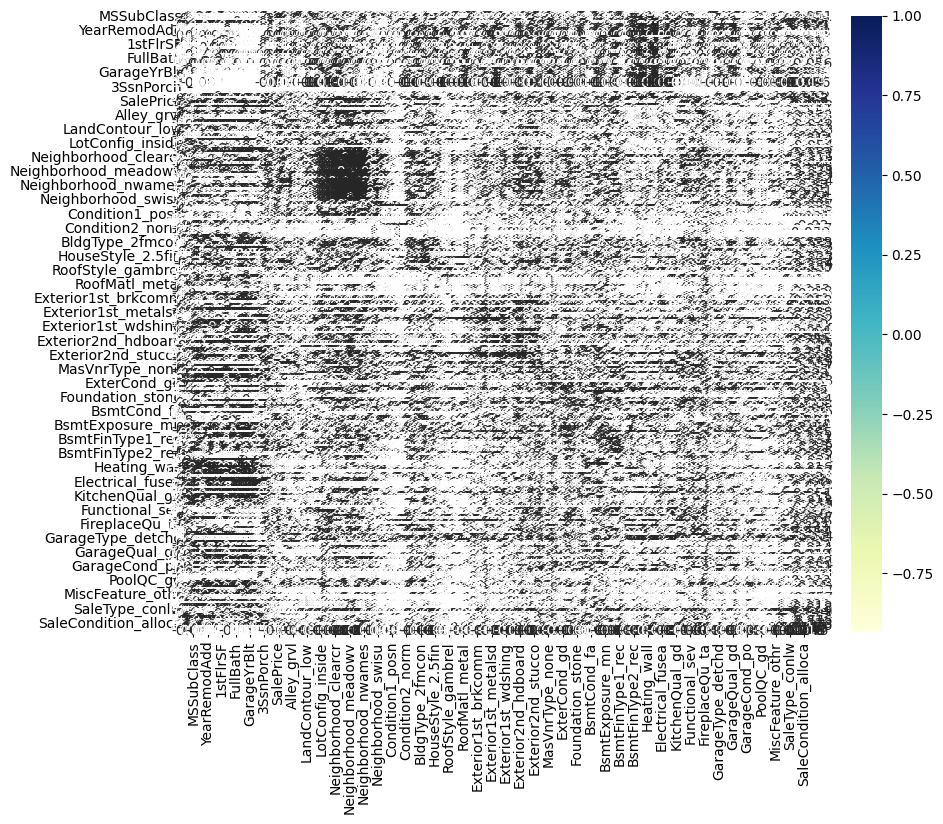

In [87]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show()

This is very hard to interpret and since we are using Regularization techniques, we don't need to explicitly handle multi-collinearity.

# Ridge Regression

Took a good range of hyper-parameter values for tuning.

Choice of folds is 5.

Choice of scoring metric is 'R2 -> R Squared'.

Regularization

In [88]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [89]:
model_cv.best_params_

{'alpha': 7.0}

This is the best value of the hyper-parameter as considered by the model.

In [90]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.058205,0.003170,0.025340,0.000961,0.0001,{'alpha': 0.0001},0.851279,0.804989,0.724803,0.882392,...,0.829059,0.059282,25,0.953074,0.946989,0.952470,0.949987,0.949785,0.950461,0.002172
1,0.054817,0.013727,0.021266,0.004376,0.001,{'alpha': 0.001},0.851607,0.805035,0.725248,0.882549,...,0.829266,0.059185,23,0.953073,0.946988,0.952469,0.949987,0.949785,0.950461,0.002172
2,0.059174,0.005911,0.023132,0.003118,0.01,{'alpha': 0.01},0.854387,0.805376,0.729446,0.883946,...,0.831107,0.058241,22,0.953042,0.946959,0.952449,0.949955,0.949754,0.950432,0.002174
3,0.074050,0.022723,0.029243,0.007387,0.05,{'alpha': 0.05},0.861357,0.805385,0.743910,0.887635,...,0.836216,0.054619,21,0.952528,0.946503,0.952089,0.949424,0.949252,0.949959,0.002185
4,0.079421,0.007780,0.039139,0.007442,0.1,{'alpha': 0.1},0.865598,0.804303,0.756172,0.889438,...,0.839448,0.051265,20,0.951502,0.945680,0.951348,0.948379,0.948278,0.949037,0.002177


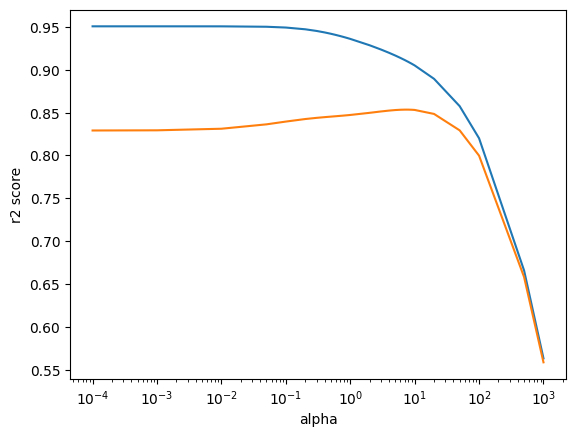

In [91]:
# plot
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.xscale('log')
plt.show()

As can be clearly seen from the above plot between hyper-parameter and the r2 score for each one, the train and test scores seems to converge at the value of hyper-parameter => 100.

Let's check by building different models with different values of alpha and see which one yields better accuracy in both train and test.

## Model 1 (alpha=10)

In [97]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm1_ridge = Ridge(alpha=10)
lm1_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm1_ridge.predict(X_train)
y_test_pred = lm1_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm1_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.9026537793512098
Test R2 Score => 0.8685778533775241
Count of variables => 248
Trained AIC => -6365.7194269026795
Test AIC => -2287.324438929169
Trained BIC => -5074.4425185435375
Test BIC => -1217.7830844105401


## Model 2 (alpha=100)

In [99]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm2_ridge = Ridge(alpha=100)
lm2_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm2_ridge.predict(X_train)
y_test_pred = lm2_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm2_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.8296998890451277
Test R2 Score => 0.8140393181283926
Count of variables => 248
Trained AIC => -5794.686041530662
Test AIC => -2135.285603785492
Trained BIC => -4503.40913317152
Test BIC => -1065.7442492668633


## Model 3 (alpha=1000)

In [101]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm3_ridge = Ridge(alpha=1000)
lm3_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm3_ridge.predict(X_train)
y_test_pred = lm3_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm3_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.5970942132203197
Test R2 Score => 0.5772614519735495
Count of variables => 248
Trained AIC => -4915.46157498205
Test AIC => -1775.591841831802
Trained BIC => -3624.1846666229076
Test BIC => -706.0504873131731


## Model 4 (alpha=1)

In [102]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm4_ridge = Ridge(alpha=1)
lm4_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm4_ridge.predict(X_train)
y_test_pred = lm4_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm4_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.9317943572312433
Test R2 Score => 0.8536694133329019
Count of variables => 248
Trained AIC => -6728.936714477147
Test AIC => -2240.2597100494345
Trained BIC => -5437.659806118005
Test BIC => -1170.7183555308056


## Model 5 (alpha=0.1)

In [103]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm5_ridge = Ridge(alpha=0.1)
lm5_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm5_ridge.predict(X_train)
y_test_pred = lm5_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm5_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.9448803049037645
Test R2 Score => 0.7738446886052591
Count of variables => 248
Trained AIC => -6946.430343697683
Test AIC => -2049.574821202529
Trained BIC => -5655.153435338541
Test BIC => -980.0334666839003


## Model 6 (alpha=7)

In [104]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm6_ridge = Ridge(alpha=7)
lm6_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm6_ridge.predict(X_train)
y_test_pred = lm6_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm6_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.908190592522139
Test R2 Score => 0.8700375273191856
Count of variables => 248
Trained AIC => -6425.50830722255
Test AIC => -2292.2164163858124
Trained BIC => -5134.231398863408
Test BIC => -1222.6750618671836


## Ridge Model Selection

Clearly, Model 6 has better accuracy and the difference between train and test is not huge. Also, the AIC & BIC values look better compared to the others.

We will take Model 1 as our final model for Ridge Regression and below we find the model parameters (variable coefficients).

In [105]:
# ridge model parameters
ridge_model_parameters = list(lm6_ridge.coef_)
ridge_model_parameters.insert(0, lm6_ridge.intercept_)
ridge_model_parameters = [round(x, 3) for x in ridge_model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, ridge_model_parameters))

[('constant', -0.032),
 ('MSSubClass', -0.02),
 ('LotFrontage', 0.003),
 ('LotArea', 0.029),
 ('OverallQual', 0.06),
 ('OverallCond', 0.027),
 ('YearBuilt', 0.014),
 ('YearRemodAdd', 0.015),
 ('MasVnrArea', 0.009),
 ('BsmtFinSF1', 0.042),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', 0.012),
 ('TotalBsmtSF', 0.044),
 ('1stFlrSF', 0.056),
 ('2ndFlrSF', 0.063),
 ('LowQualFinSF', 0.0),
 ('GrLivArea', 0.051),
 ('BsmtFullBath', 0.011),
 ('BsmtHalfBath', 0.0),
 ('FullBath', 0.026),
 ('HalfBath', 0.009),
 ('BedroomAbvGr', -0.004),
 ('KitchenAbvGr', 0.0),
 ('TotRmsAbvGrd', 0.016),
 ('Fireplaces', 0.016),
 ('GarageYrBlt', 0.004),
 ('GarageCars', 0.023),
 ('GarageArea', 0.021),
 ('WoodDeckSF', 0.009),
 ('OpenPorchSF', 0.005),
 ('EnclosedPorch', 0.0),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 0.0),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('MoSold', -0.002),
 ('YrSold', -0.003),
 ('MSZoning_fv', 0.009),
 ('MSZoning_rh', 0.006),
 ('MSZoning_rl', 0.009),
 ('MSZoning_rm', 0.005),
 ('Street_pave', 0.002),
 ('Alley

In [106]:
lm6_ridge.get_params()

{'alpha': 7,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.0001}

In [107]:
from operator import itemgetter

variables = sorted(list(zip(cols, ridge_model_parameters)),key=itemgetter(1))

for v in variables:
    if v[1] != 0 and abs(v[1]) > 0.01 :
        print(str(v[0]) + ' : ' + str(round(v[1],2)))

PoolQC_gd : -0.04
Condition2_posn : -0.04
constant : -0.03
KitchenQual_gd : -0.03
KitchenQual_ta : -0.03
Neighborhood_edwards : -0.03
Neighborhood_mitchel : -0.02
MSSubClass : -0.02
KitchenQual_fa : -0.02
ExterQual_ta : -0.02
BldgType_duplex : -0.02
Neighborhood_names : -0.01
Condition1_rrae : -0.01
LotShape_ir3 : -0.01
LotConfig_fr2 : -0.01
BsmtQual_gd : -0.01
Neighborhood_sawyer : -0.01
BldgType_2fmcon : -0.01
ExterQual_gd : -0.01
GarageQual_fa : -0.01
Neighborhood_idotrr : -0.01
Neighborhood_oldtown : -0.01
Exterior2nd_wd shng : -0.01
BsmtQual_ta : -0.01
BsmtExposure_no : -0.01
BsmtFullBath : 0.01
LotConfig_culdsac : 0.01
Condition2_posa : 0.01
BsmtUnfSF : 0.01
YearBuilt : 0.01
YearRemodAdd : 0.02
LandContour_hls : 0.02
LandContour_lvl : 0.02
Condition1_norm : 0.02
TotRmsAbvGrd : 0.02
Fireplaces : 0.02
Condition2_norm : 0.02
Neighborhood_somerst : 0.02
FireplaceQu_ex : 0.02
Functional_typ : 0.02
Exterior2nd_imstucc : 0.02
GarageArea : 0.02
Exterior1st_brkface : 0.02
BsmtExposure_gd 

We filtered out variables with their coefficient's absolute values > 0.01 since there are 248 of them in total.

# Lasso Regression

In [108]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [109]:
model_cv.best_params_

{'alpha': 0.0001}

This is the best value of the hyper-parameter as considered by the model.

In [110]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.068486,0.022829,0.020743,0.008325,0.0001,{'alpha': 0.0001},0.893539,0.827369,0.822373,0.900621,...,0.867478,0.034921,1,0.935564,0.934357,0.936508,0.935692,0.933325,0.935089,0.001118
1,0.065766,0.024129,0.022027,0.007899,0.001,{'alpha': 0.001},0.882744,0.782532,0.834508,0.874857,...,0.838549,0.036997,2,0.851604,0.866659,0.865112,0.851737,0.852437,0.857510,0.006862
2,0.066509,0.007903,0.025323,0.000580,0.01,{'alpha': 0.01},0.547506,0.415764,0.499583,0.541494,...,0.479642,0.063667,3,0.494807,0.479320,0.480486,0.507247,0.485411,0.489454,0.010438
3,0.052523,0.012456,0.019816,0.006214,0.05,{'alpha': 0.05},-0.012776,-0.008899,-0.000067,-0.003405,...,-0.005659,0.004557,4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.050549,0.018345,0.019498,0.004741,0.1,{'alpha': 0.1},-0.012776,-0.008899,-0.000067,-0.003405,...,-0.005659,0.004557,4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


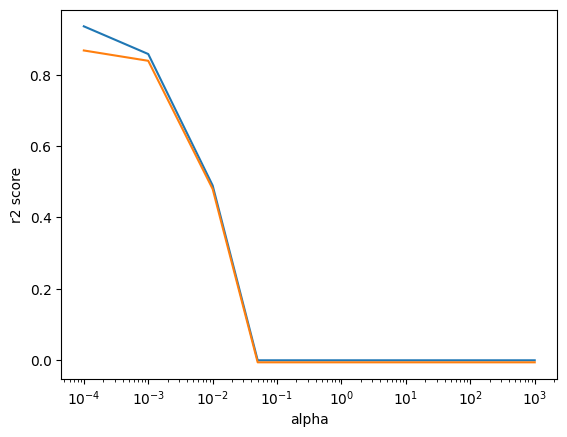

In [111]:
# plot
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.xscale('log')
plt.show()

As can be clearly seen from the above plot between hyper-parameter and the r2 score for each one, the train and test scores seems to converge at the value of hyper-parameter => 0.001.

Let's check by building different models with different values of alpha and see which one yields better accuracy in both train and test.

## Model 1 (alpha=0.001)

In [113]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm1_lasso = Lasso(alpha=0.001)
lm1_lasso.fit(X_train, y_train)

# Predict
y_train_pred = lm1_lasso.predict(X_train)
y_test_pred = lm1_lasso.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = np.sum(lm1_lasso.coef_ != 0) + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm1_lasso.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.8523554234854849
Test R2 Score => 0.8305185848070978
Count of variables => 35
Trained AIC => -6392.438246886339
Test AIC => -2627.9284943767025
Trained BIC => -6215.010885432411
Test BIC => -2480.9686136031505


## Model 2 (alpha=0.01)

In [115]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm2_lasso = Lasso(alpha=0.01)
lm2_lasso.fit(X_train, y_train)

# Predict
y_train_pred = lm2_lasso.predict(X_train)
y_test_pred = lm2_lasso.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = np.sum(lm2_lasso.coef_ != 0) + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm2_lasso.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.48914330292507713
Test R2 Score => 0.4686144592892073
Count of variables => 11
Trained AIC => -5173.090101719583
Test AIC => -2175.406382692902
Trained BIC => -5113.947647901607
Test BIC => -2126.4197557683847


## Model 3 (alpha=0.1)

In [116]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm3_lasso = Lasso(alpha=0.1)
lm3_lasso.fit(X_train, y_train)

# Predict
y_train_pred = lm3_lasso.predict(X_train)
y_test_pred = lm3_lasso.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = np.sum(lm3_lasso.coef_ != 0) + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm3_lasso.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.0
Test R2 Score => -0.00030262183303753076
Count of variables => 0
Trained AIC => -4509.318947907381
Test AIC => -1920.340708728716
Trained BIC => -4504.390410089216
Test BIC => -1916.2584898183395


## Model 4 (alpha=0.0001)

In [117]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm4_lasso = Lasso(alpha=0.0001)
lm4_lasso.fit(X_train, y_train)

# Predict
y_train_pred = lm4_lasso.predict(X_train)
y_test_pred = lm4_lasso.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = np.sum(lm4_lasso.coef_ != 0) + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm4_lasso.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.930519466060732
Test R2 Score => 0.8211776584803463
Count of variables => 120
Trained AIC => -6992.028482465102
Test AIC => -2434.4299995469273
Trained BIC => -6395.675406467177
Test BIC => -1940.4815113913774


## Lasso Model Selection

Clearly, Model 1 has better accuracy and the difference between train and test is not huge besides having lesser number of variables.  Also, the AIC & BIC values look better compared to the others.

We will take Model 1 as our final model for Lasso Regression and below we find the model parameters (variable coefficients).

In [118]:
# ridge model parameters
lasso_model_parameters = list(lm1_lasso.coef_)
lasso_model_parameters.insert(0, lm1_lasso.intercept_)
lasso_model_parameters = [round(x, 3) for x in lasso_model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, lasso_model_parameters))

[('constant', -0.023),
 ('MSSubClass', -0.01),
 ('LotFrontage', 0.0),
 ('LotArea', 0.027),
 ('OverallQual', 0.122),
 ('OverallCond', 0.006),
 ('YearBuilt', 0.0),
 ('YearRemodAdd', 0.02),
 ('MasVnrArea', 0.003),
 ('BsmtFinSF1', 0.033),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', 0.0),
 ('TotalBsmtSF', 0.05),
 ('1stFlrSF', 0.0),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', 0.0),
 ('GrLivArea', 0.145),
 ('BsmtFullBath', 0.0),
 ('BsmtHalfBath', 0.0),
 ('FullBath', 0.0),
 ('HalfBath', 0.0),
 ('BedroomAbvGr', 0.0),
 ('KitchenAbvGr', 0.0),
 ('TotRmsAbvGrd', 0.0),
 ('Fireplaces', 0.018),
 ('GarageYrBlt', 0.0),
 ('GarageCars', 0.0),
 ('GarageArea', 0.032),
 ('WoodDeckSF', 0.002),
 ('OpenPorchSF', 0.0),
 ('EnclosedPorch', 0.0),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 0.0),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('MoSold', 0.0),
 ('YrSold', -0.0),
 ('MSZoning_fv', 0.0),
 ('MSZoning_rh', -0.0),
 ('MSZoning_rl', 0.0),
 ('MSZoning_rm', -0.007),
 ('Street_pave', 0.0),
 ('Alley_grvl', -0.0),
 ('Alley_pave', 0.0),
 (

In [119]:
lm1_lasso.get_params()

{'alpha': 0.001,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': 1000,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

In [120]:
from operator import itemgetter

variables = sorted(list(zip(cols, lasso_model_parameters)),key=itemgetter(1))

for v in variables:
    if v[1] != 0 and abs(v[1]) > 0.01 :
        print(str(v[0]) + ' : ' + str(round(v[1],2)))

constant : -0.02
ExterQual_ta : -0.01
Neighborhood_nridght : 0.02
BsmtExposure_gd : 0.02
Fireplaces : 0.02
YearRemodAdd : 0.02
LotArea : 0.03
GarageArea : 0.03
BsmtFinSF1 : 0.03
Neighborhood_noridge : 0.04
TotalBsmtSF : 0.05
BsmtQual_ex : 0.06
OverallQual : 0.12
GrLivArea : 0.14


We filtered out variables with their coefficient's absolute values > 0.01 since there are 35 of them in total.

In [121]:
ridge_variables = []

for v in variables:
    if v[1] != 0 and v[0]!='constant':
        ridge_variables.append(v[0])

ridge_variables

['ExterQual_ta',
 'MSSubClass',
 'BsmtExposure_no',
 'KitchenQual_ta',
 'MSZoning_rm',
 'Neighborhood_edwards',
 'BsmtQual_ta',
 'HeatingQC_ta',
 'Neighborhood_somerst',
 'FireplaceQu_gd',
 'WoodDeckSF',
 'CentralAir_y',
 'GarageType_attchd',
 'SaleType_new',
 'MasVnrArea',
 'Foundation_pconc',
 'OverallCond',
 'BsmtFinType1_glq',
 'Functional_typ',
 'Condition1_norm',
 'GarageFinish_fin',
 'Neighborhood_nridght',
 'BsmtExposure_gd',
 'Fireplaces',
 'YearRemodAdd',
 'LotArea',
 'GarageArea',
 'BsmtFinSF1',
 'Neighborhood_noridge',
 'TotalBsmtSF',
 'BsmtQual_ex',
 'OverallQual',
 'GrLivArea']

The features selected by Lasso will be used to build a Ridge regression model again.

# Ride Regression Again

In [122]:
X_train = X_train[ridge_variables]

In [123]:
X_test = X_test[ridge_variables]

In [124]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [125]:
model_cv.best_params_

{'alpha': 1.0}

This is the best value of the hyper-parameter as considered by the model.

In [126]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.014102,0.004453,0.004958,0.000974,0.0001,{'alpha': 0.0001},0.879260,0.811228,0.847661,0.874004,...,0.854254,0.024223,16,0.864378,0.883130,0.871905,0.866250,0.868134,0.870759,0.006668
1,0.014064,0.002493,0.006461,0.002050,0.001,{'alpha': 0.001},0.879262,0.811225,0.847663,0.874007,...,0.854255,0.024225,15,0.864378,0.883130,0.871905,0.866250,0.868134,0.870759,0.006668
2,0.018391,0.001298,0.009117,0.000204,0.01,{'alpha': 0.01},0.879286,0.811195,0.847688,0.874037,...,0.854263,0.024243,14,0.864378,0.883130,0.871905,0.866250,0.868134,0.870759,0.006668
3,0.017304,0.000580,0.008788,0.000230,0.05,{'alpha': 0.05},0.879388,0.811059,0.847797,0.874166,...,0.854297,0.024327,13,0.864378,0.883129,0.871904,0.866249,0.868133,0.870759,0.006668
4,0.018316,0.002401,0.008800,0.000671,0.1,{'alpha': 0.1},0.879515,0.810891,0.847930,0.874325,...,0.854338,0.024430,12,0.864375,0.883127,0.871901,0.866246,0.868131,0.870756,0.006668


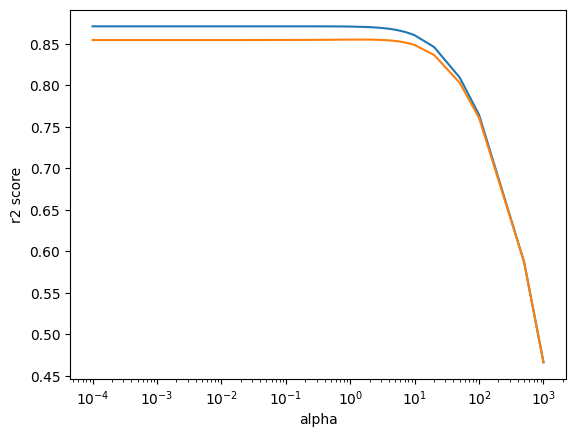

In [127]:
# plot
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.xscale('log')
plt.show()

As can be clearly seen from the above plot between hyper-parameter and the r2 score for each one, the train and test scores seems to converge at the value of hyper-parameter => 100.

Let's check by building different models with different values of alpha and see which one yields better accuracy in both train and test.

## Model 1 (alpha=100)

In [129]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm1_ridge = Ridge(alpha=100)
lm1_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm1_ridge.predict(X_train)
y_test_pred = lm1_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm1_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.7787622909019386
Test R2 Score => 0.7530389248903007
Count of variables => 33
Trained AIC => -5983.515365167174
Test AIC => -2467.0269879343928
Trained BIC => -5815.945079349576
Test BIC => -2328.2315449815937


## Model 2 (alpha=10)

In [131]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn import metrics

# Function to calculate AIC
def calculate_aic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    aic = n * np.log(sse / n) + 2 * num_params
    return aic

# Function to calculate BIC
def calculate_bic(y_true, y_pred, num_params):
    residuals = y_true - y_pred
    sse = np.sum(residuals ** 2)
    n = len(y_true)
    bic = n * np.log(sse / n) + num_params * np.log(n)
    return bic

# Model with optimal alpha
lm2_ridge = Ridge(alpha=10)
lm2_ridge.fit(X_train, y_train)

# Predict
y_train_pred = lm2_ridge.predict(X_train)
y_test_pred = lm2_ridge.predict(X_test)

# Calculate number of parameters (including intercept)
num_params = X_train.shape[1] + 1

# Print R2 scores
print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))

# Print count of non-zero coefficients
print("Count of variables => " + str(np.sum(lm2_ridge.coef_ != 0)))

# Print AIC
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, num_params)))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, num_params)))

# Print BIC
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, num_params)))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, num_params)))


Trained R2 Score => 0.860804468698912
Test R2 Score => 0.8366306764129496
Count of variables => 33
Trained AIC => -6456.603970547274
Test AIC => -2648.0161683586657
Trained BIC => -6289.033684729676
Test BIC => -2509.2207254058667


## Model 3 (alpha=1)

In [132]:
from sklearn import metrics

# model with optimal alpha
# ridge regression
lm3_ridge = Ridge(alpha=1)
lm3_ridge.fit(X_train, y_train)

# predict
y_train_pred = lm3_ridge.predict(X_train)
y_test_pred = lm3_ridge.predict(X_test)

print("Trained R2 Score => " + str(metrics.r2_score(y_true=y_train, y_pred=y_train_pred)))
print("Test R2 Score => " + str(metrics.r2_score(y_true=y_test, y_pred=y_test_pred)))
print("Count of variables => " + str(np.sum(lm3_ridge.coef_ != 0)))  # Use lm3_ridge for count of variables
print('')
print("Trained AIC => " + str(calculate_aic(y_train, y_train_pred, len(X_train.columns))))
print("Test AIC => " + str(calculate_aic(y_test, y_test_pred, len(X_train.columns))))
print('')
print("Trained BIC => " + str(calculate_bic(y_train, y_train_pred, len(X_train.columns))))
print("Test BIC => " + str(calculate_bic(y_test, y_test_pred, len(X_train.columns))))


Trained R2 Score => 0.8685874348840947
Test R2 Score => 0.8441419900544245
Count of variables => 33

Trained AIC => -6517.350185084018
Test AIC => -2670.6319639829367

Trained BIC => -6354.708437084584
Test BIC => -2535.918739940514


## Ridge Model Selection

Clearly, Model 3 has better accuracy and the difference between train and test is not huge.  Also, the AIC & BIC values look better compared to the others.

We will take Model 3 as our final model for Ridge Regression and below we find the model parameters (variable coefficients).

In [133]:
# ridge model parameters
ridge_model_parameters = list(lm3_ridge.coef_)
ridge_model_parameters.insert(0, lm3_ridge.intercept_)
ridge_model_parameters = [round(x, 3) for x in ridge_model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, ridge_model_parameters))

[('constant', -0.072),
 ('ExterQual_ta', -0.008),
 ('MSSubClass', -0.02),
 ('BsmtExposure_no', -0.012),
 ('KitchenQual_ta', -0.004),
 ('MSZoning_rm', -0.008),
 ('Neighborhood_edwards', -0.017),
 ('BsmtQual_ta', -0.004),
 ('HeatingQC_ta', -0.002),
 ('Neighborhood_somerst', 0.029),
 ('FireplaceQu_gd', -0.002),
 ('WoodDeckSF', 0.007),
 ('CentralAir_y', 0.006),
 ('GarageType_attchd', -0.001),
 ('SaleType_new', 0.012),
 ('MasVnrArea', 0.0),
 ('Foundation_pconc', 0.003),
 ('OverallCond', 0.03),
 ('BsmtFinType1_glq', 0.004),
 ('Functional_typ', 0.019),
 ('Condition1_norm', 0.019),
 ('GarageFinish_fin', 0.01),
 ('Neighborhood_nridght', 0.039),
 ('BsmtExposure_gd', 0.021),
 ('Fireplaces', 0.028),
 ('YearRemodAdd', 0.014),
 ('LotArea', 0.033),
 ('GarageArea', 0.026),
 ('BsmtFinSF1', 0.04),
 ('Neighborhood_noridge', 0.074),
 ('TotalBsmtSF', 0.052),
 ('BsmtQual_ex', 0.055),
 ('OverallQual', 0.129),
 ('GrLivArea', 0.154)]

In [134]:
lm3_ridge.get_params()

{'alpha': 1,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.0001}

In [135]:
from operator import itemgetter

variables = sorted(list(zip(cols, ridge_model_parameters)),key=itemgetter(1))

for v in variables:
    if v[1] != 0 and abs(v[1]) > 0.01 :
        print(str(v[0]) + ' : ' + str(round(v[1],2)))

constant : -0.07
MSSubClass : -0.02
Neighborhood_edwards : -0.02
BsmtExposure_no : -0.01
SaleType_new : 0.01
YearRemodAdd : 0.01
Functional_typ : 0.02
Condition1_norm : 0.02
BsmtExposure_gd : 0.02
GarageArea : 0.03
Fireplaces : 0.03
Neighborhood_somerst : 0.03
OverallCond : 0.03
LotArea : 0.03
Neighborhood_nridght : 0.04
BsmtFinSF1 : 0.04
TotalBsmtSF : 0.05
BsmtQual_ex : 0.06
Neighborhood_noridge : 0.07
OverallQual : 0.13
GrLivArea : 0.15


We filtered out variables with their coefficient's absolute values > 0.01 since there are 33 of them in total.

# Final Predictor Variables

The variable which have higher value of coefficients for Ridge and Lasso match and hence below are our final most important predictor variables.

1) TotalBsmtSF with a +ve coefficient => More the basement area, more the price.

2) BsmtQual_ex with a +ve coefficient => Higher the price for houses with basement height > 100 inches.

3) OverallQual with a +ve coefficient => More the overall material quality and finish, more the price.

4) GrLivArea with a +ve coefficient => More the living area, more the price.

5) Neighborhood_noridge with a +ve coefficient => Neighbourhoods of noridge demand more price.


There are other variables with weak -ve coefficients like MSSubClass, Neighborhood_edwards but they are not that significant compared to the +ve ones. Hence, not considered in the final variable list.